# Housekeeping steps

In [214]:
import cde_reg_functions as cr 

import matplotlib.pyplot as plt
import scipy.signal as sgn
import numpy as np
import os 
import ants
import shutil

# Jupyter specific autoreloading for external functions (in case changes are made)
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [78]:
# Housekeeping
#===================================================================================
Fbase    = '/Users/roschkoenig/Dropbox/Research/1812 Critical Dynamics Epilepsy'
Fsave    = '/Users/roschkoenig/Dropbox/Research/1812 Critical Dynamics Epilepsy Data'
Fscripts = Fbase + os.sep + '04 - Atlas registration'
Fdata    = '/Volumes/MARIANNE/1812 Critical Dynamics in Epilepsy'
Ftemps   = Fsave + os.sep + 'Templates'
Zfish    = cr.fishspec(Fdata, prefx='RM')

# Generate intermediate reference

In [3]:
# Load image for intermediate registration and ZBB template
#-----------------------------------------------------------------------------------
frf  = ants.image_read(Ftemps + os.sep + 'Confoc.tif')     # functional reference 
frf.set_spacing([.3,.3,1.])
frf.set_direction(np.array([[-1.,0.,0.],[0.,1.,0.],[0.,0.,-1.]]))

# Set spacing for ZBB data
#-----------------------------------------------------------------------------------
zbb1 = ants.image_read(Ftemps + os.sep + 'HuC-Cer.tif')      # contains eyes and stuff
zbb2 = ants.image_read(Ftemps + os.sep + 'vglut-DsRed.tif')  # is a better match for the glut image above
zbb1.set_spacing([.3,.3,1.])
zbb2.set_spacing([.3,.3,1.])

zbb  = (zbb1 / np.amax(zbb1.numpy()) + zbb2 / np.amax(zbb2.numpy()))
zbb.set_spacing([.3,.3,1.])

## Register confocal image to atlas

In [178]:
frf.set_direction(np.array([[-1.,0.,0.],[0.,1.,0.],[0.,0.,-1.]]))
cf2ref_R = ants.registration(zbb1, frf, type_of_transform = 'QuickRigid')
cf2ref_S = ants.registration(zbb, cf2ref_R['warpedmovout'], type_of_transform = 'SyN')

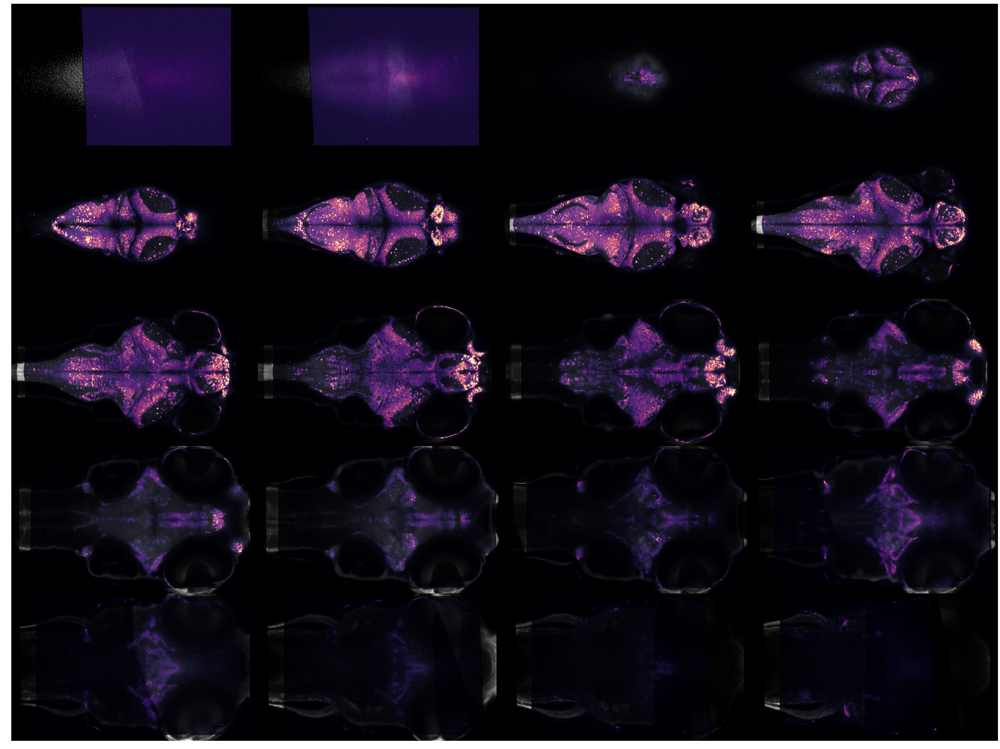

In [179]:
cr.fishplot(zbb1, cf2ref_S['warpedmovout'], al = .8)

In [186]:
Ftwarps = Ftemps + os.sep + 'CF2REF'
if not os.path.exists(Ftwarps): os.makedirs(Ftwarps)
    
shutil.copy2(cf2ref_R['fwdtransforms'][0], Ftwarps + os.sep + 'cf2ref_R.mat')
shutil.copy2(cf2ref_R['invtransforms'][0], Ftwarps + os.sep + 'ref2cf_R.mat')

shutil.copy2(cf2ref_S['fwdtransforms'][0], Ftwarps + os.sep + 'cf2ref_S.nii.gz')     # affine step
shutil.copy2(cf2ref_S['fwdtransforms'][1], Ftwarps + os.sep + 'cf2ref_S.mat')  # SyN step
shutil.copy2(cf2ref_S['invtransforms'][0], Ftwarps + os.sep + 'ref2cf_S.mat')     # affine step
shutil.copy2(cf2ref_S['invtransforms'][1], Ftwarps + os.sep + 'ref2cf_S.nii.gz')  # SyN step


'/Users/roschkoenig/Dropbox/Research/1812 Critical Dynamics Epilepsy Data/Templates/CF2REF/ref2cf_S.nii.gz'

# Register mean functional image to confocal image

I found 7226 images
Of these Im loading 10


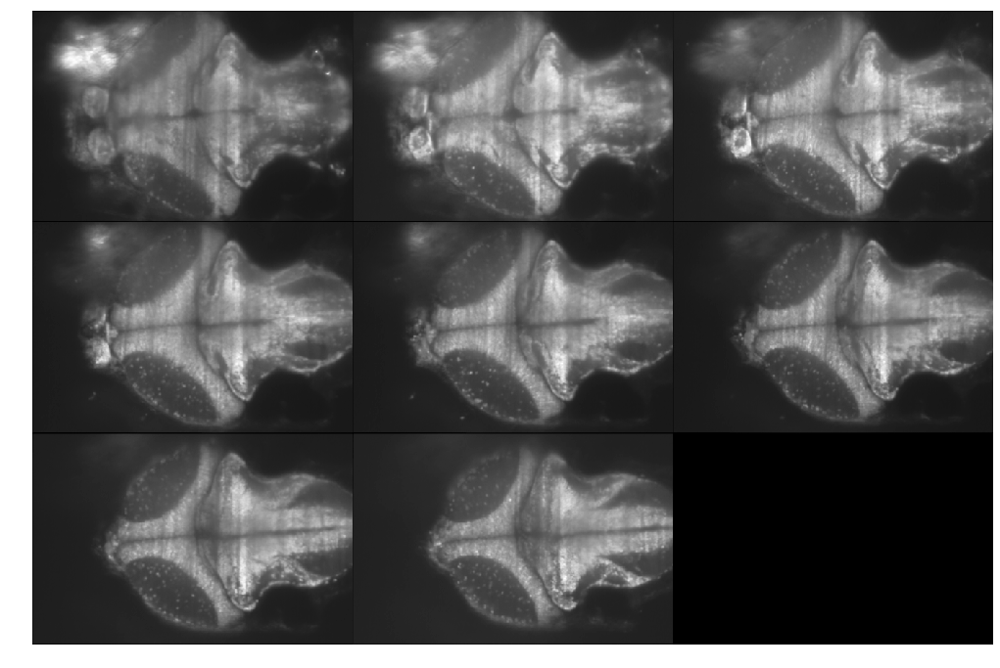

In [79]:
# Generate mean image for registration and load reference
#===================================================================================
f = 0
c = 0

imgs = Zfish[f]["Cond"][c]["Tifs"]
Fimg = Zfish[f]["Cond"][c]["Path"]

mimg, imglist = cr.meancalc(imgs, Fimg, noimages = 10, delfirst = False)
mimg.set_direction(np.array([[-1.,0.,0.],[0.,1.,0.],[0.,0.,-1.]]))


In [116]:
mimg.set_spacing([.3,.3,6.])

In [7]:
fun2cf_R = ants.registration(frf, mimg, type_of_transform = 'Similarity', grad_step = .0)
fun2cf_S = ants.registration(frf, fun2cf_R['warpedmovout'], type_of_transform = 'SyNOnly', flow_sigma=.2)

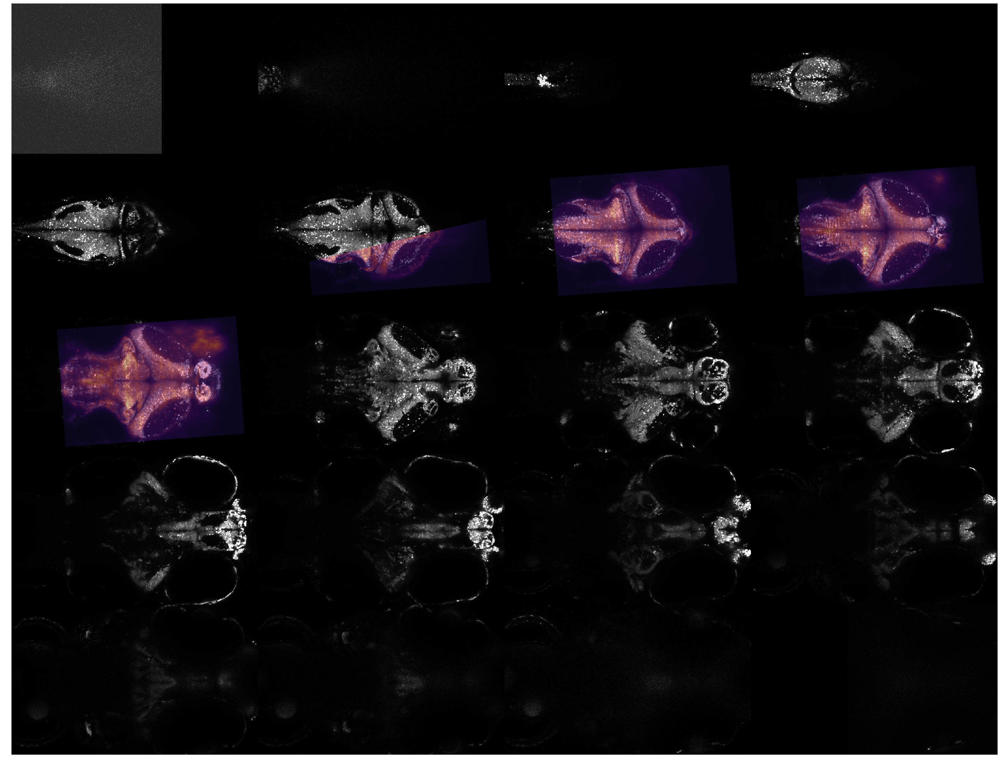

In [174]:
cr.fishplot(frf, fun2cf_R['warpedmovout'], orient = 'axial', al = .5)

In [182]:
Fwarps = Fsave + os.sep + 'Analysis' + os.sep + 'Registration' + os.sep + Zfish[f]["Name"] \
       + os.sep + Zfish[f]["Cond"][c]["Name"] + os.sep + 'CF2REF'
if not os.path.exists(Fwarps): os.makedirs(Fwarps)
    
shutil.copy2(fun2cf_R['fwdtransforms'][0], Fwarps + os.sep + 'fun2cf_R.mat')
shutil.copy2(fun2cf_R['invtransforms'][0], Fwarps + os.sep + 'cf2fun_R.mat')

shutil.copy2(fun2cf_S['fwdtransforms'][0], Fwarps + os.sep + 'fun2cf_S.nii.gz')     # affine step
shutil.copy2(fun2cf_S['fwdtransforms'][1], Fwarps + os.sep + 'fun2cf_S.mat')  # SyN step
shutil.copy2(fun2cf_S['invtransforms'][0], Fwarps + os.sep + 'cf2fun_S.mat')     # affine step
shutil.copy2(fun2cf_S['invtransforms'][1], Fwarps + os.sep + 'cf2fun_S.nii.gz')  # SyN step

'/Users/roschkoenig/Dropbox/Research/1812 Critical Dynamics Epilepsy Data/Analysis/Registration/ZFRR004_02/BL/CF2REF/cf2fun_S.nii.gz'

In [218]:
ant = ants.image_read(Ftemps + os.sep + 'z-brain.tif')
ant.set_spacing([.6,.6,2.])

in_cf = ants.apply_transforms(frf, ant, \
                                  [ Ftwarps + os.sep + 'ref2cf_R.mat', 
                                    Ftwarps + os.sep + 'ref2cf_S.mat',
                                    Ftwarps + os.sep + 'ref2cf_S.nii.gz' ],
                                  whichtoinvert = [True, True, False])

in_fun = ants.apply_transforms(mimg, in_cf, \
                                  [ Fwarps + os.sep + 'cf2fun_R.mat',
                                    Fwarps + os.sep + 'cf2fun_S.mat', 
                                    Fwarps + os.sep + 'cf2fun_S.nii.gz'], \
                                  whichtoinvert = [True, True, False])

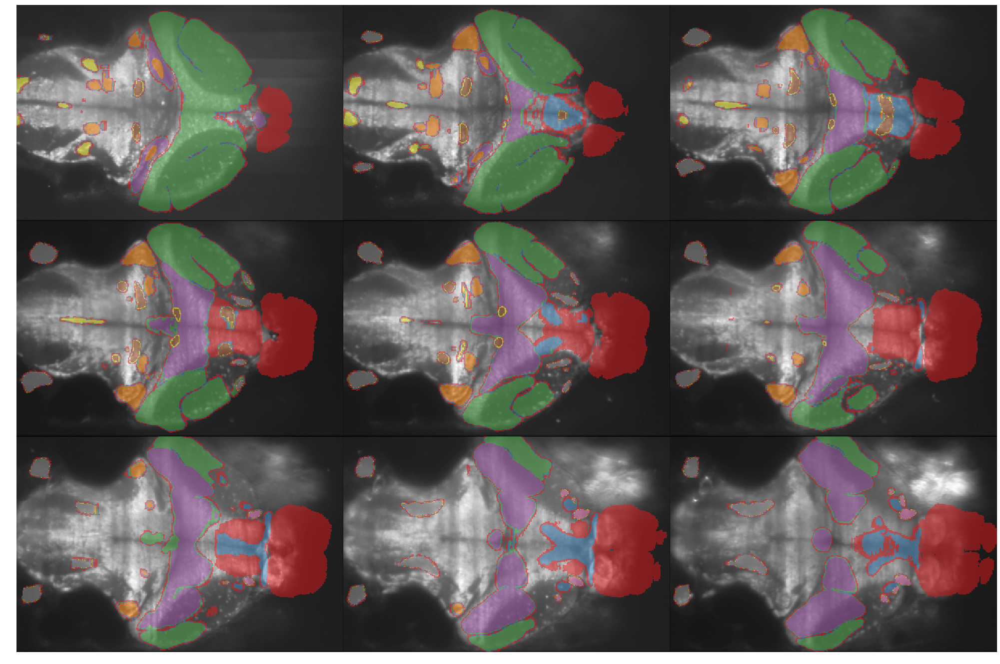

In [219]:
cr.fishplot(mimg, in_fun, col = 'Set1')

In [233]:
clean_at = in_fun[in_fun.numpy()%1 == 0]

IndexError: too many indices for array






# Nothing to see here...

In [6]:
your_fish_looks = 'L'  # 'L'eft, 'R'ight, 'U'p, 'D'own

In [69]:
?ants.registration

Signature: ants.registration(fixed, moving, type_of_transform='SyN', initial_transform=None, outprefix='', mask=None, grad_step=0.2, flow_sigma=3, total_sigma=0, aff_metric='mattes', aff_sampling=32, syn_metric='mattes', syn_sampling=32, reg_iterations=(40, 20, 0), verbose=False, multivariate_extras=None, **kwargs)
Docstring:
Register a pair of images either through the full or simplified
interface to the ANTs registration method.

ANTsR function: `antsRegistration`

Arguments
---------
fixed : ANTsImage
    fixed image to which we register the moving image.

moving : ANTsImage
    moving image to be mapped to fixed space.

type_of_transform : string
    A linear or non-linear registration type. Mutual information metric by default.
    See Notes below for more.

initial_transform : list of strings (optional)
    transforms to prepend

outprefix : string
    output will be named with this prefix.

mask : ANTsImage (optional)
    mask the registration.

grad_step : scalar
    gradient s

In [7]:
ms  = [.4,.4,8]
mimg.set_spacing(list(ms))

if your_fish_looks == 'L': 
    mimg.set_direction(np.array([[-1.,0.,0.],[0.,1.,0.],[0.,0.,-1.]]))    

In [ ]:
cr.fishplot(frf,fun2cf_R['warpedmovout'], al = .5)